In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from dynadojo.systems.gilpin_flows import GilpinFlowsSystem
from dynadojo.wrappers import SystemChecker, AlgorithmChecker
from dynadojo.utils.lds import plot
from dynadojo.baselines.sindy import SINDy
from dynadojo.challenges import FixedComplexity
from dynadojo.baselines.lr import LinearRegression

(<Figure size 640x480 with 1 Axes>, <Axes3D: >)

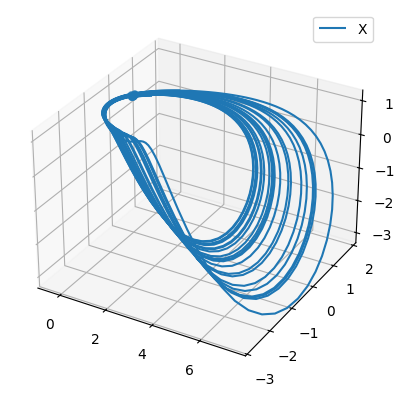

In [140]:
latent_dim = 3
embed_dim = 3
n=10
timesteps = 300
system = SystemChecker(GilpinFlowsSystem(latent_dim, embed_dim, 'SprottJerk', seed=42))
x0 = system.make_init_conds(n)
x = system.make_data(x0, timesteps=timesteps)
plot([x], labels=["X"])

(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)
(300, 3)


(<Figure size 640x480 with 1 Axes>, <Axes3D: >)

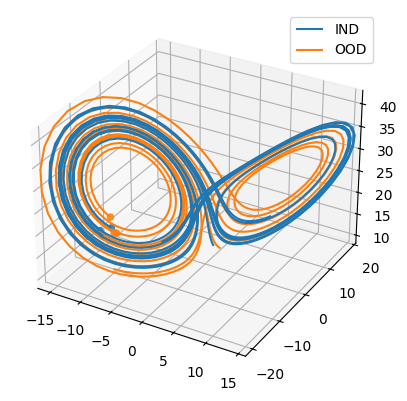

In [90]:
latent_dim = 3
embed_dim = latent_dim
n = 5
test_size = 3
timesteps = 300
system = SystemChecker(GilpinFlowsSystem(latent_dim, embed_dim, 'Lorenz', seed=1912))
x0 = system.make_init_conds(n)
y0 = system.make_init_conds(10, in_dist=False)
x = system.make_data(x0, timesteps=timesteps)
y = system.make_data(y0, timesteps=timesteps, noisy=True)
plot([x, y], target_dim=min(latent_dim, 3), labels=["IND", "OOD"], max_lines=test_size)

y_err=35.16881835223303


(<Figure size 640x480 with 1 Axes>, <Axes3D: >)

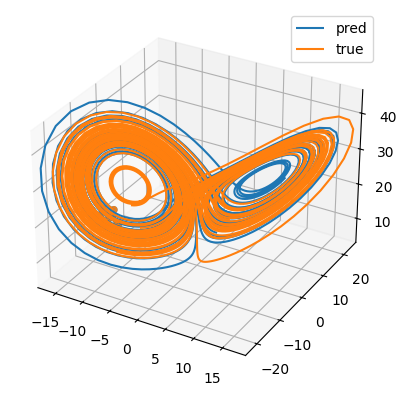

In [91]:

sindy = AlgorithmChecker(SINDy(embed_dim, timesteps, max_control_cost=0, seed=100))
sindy.fit(x)
y_pred = sindy.predict(y[:, 0], timesteps)
y_err = system.calc_error(y, y_pred)
print(f"{y_err=}")
plot([y_pred, y], target_dim=min(3, latent_dim), labels=["pred", "true"], max_lines=15)

In [28]:
challenge = FixedComplexity(
    N=[10, 50, 100, 500],
    l=2,
    e=3,
    t=50,
    control_horizons=0,
    max_control_cost_per_dim=0,
    system_cls=GilpinFlowsSystem,
    trials=10,
    test_examples=50,
    test_timesteps=50,
    system_kwargs={"system_name": "Lorenz"},
)
data = challenge.evaluate(LinearRegression, id="linear regression")

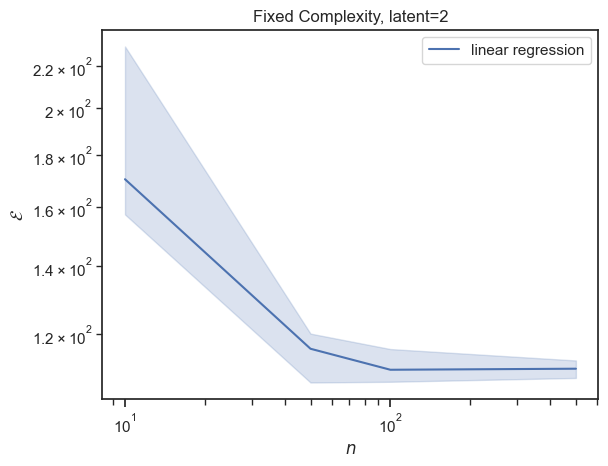

<Axes: title={'center': 'Fixed Complexity, latent=2'}, xlabel='$n$', ylabel='$\\mathcal{E}$'>

In [ ]:
challenge.plot(data)

/Users/laurenmclane/dynadojo/src/dynadojo/utils/lds.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()
/Users/laurenmclane/dynadojo/.venv/lib/python3.10/site-packages/dysts/flows.py:1565: RuntimeWarning: overflow encountered in exp
  alpham = 0.1 * (25 + v) / (1 - np.exp(-0.1 * v - 2.5))
/Users/laurenmclane/dynadojo/.venv/lib/python3.10/site-packages/dysts/flows.py:1566: RuntimeWarning: overflow encountered in exp
  betam = 4 * np.exp(-(v + 50) / 18)
/Users/laurenmclane/dynadojo/.venv/lib/python3.10/site-packages/dysts/flows.py:1569: RuntimeWarning: overflow encountered in exp
  alphah = 0.07 * np.exp(-0.05 * v - 2.5)
/Users/laurenmclane/dynadojo/.venv/lib/python3.10/site-packages/dysts/flows.py:1570:

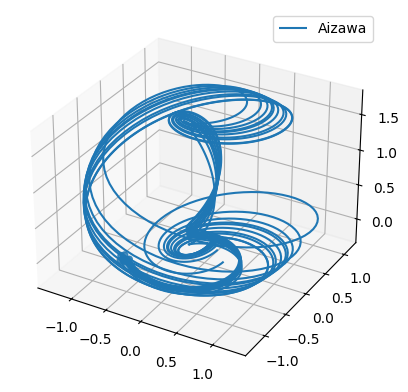

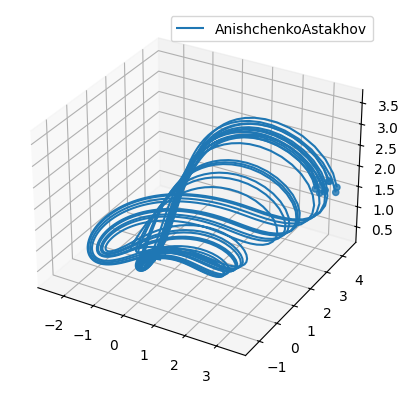

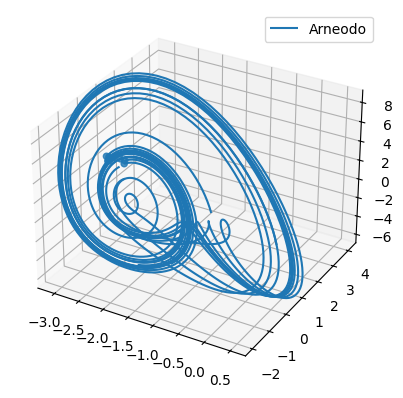

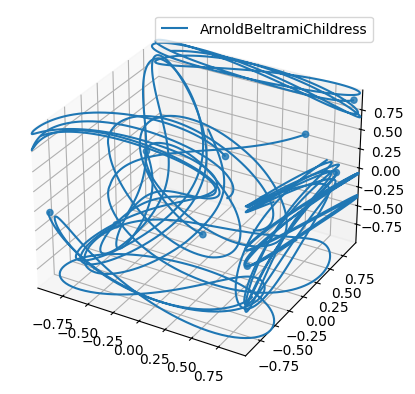

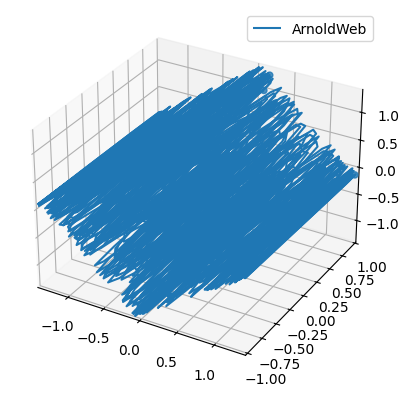

...

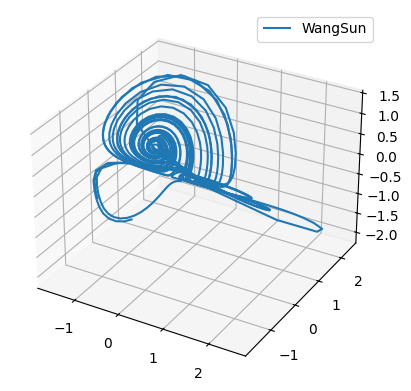

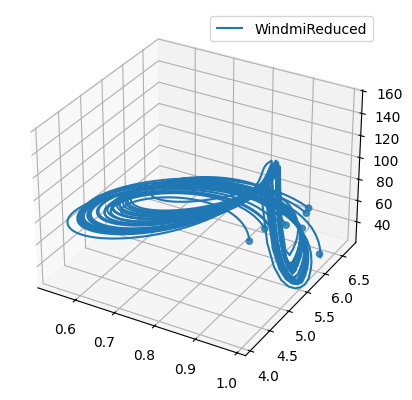

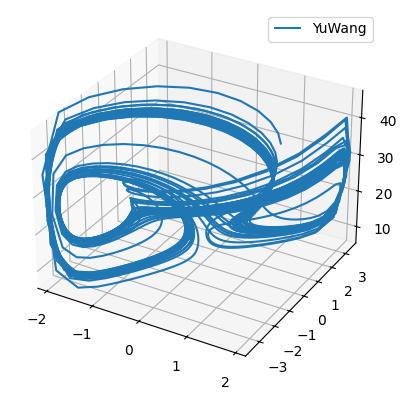

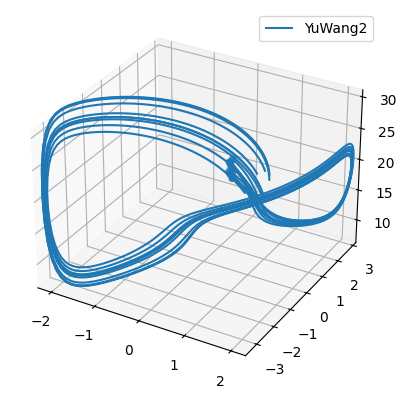

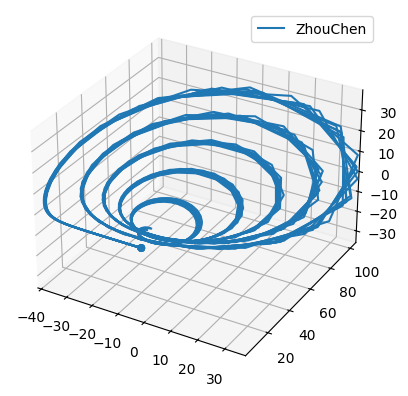

In [141]:
latent_dim = 3
embed_dim = 3
n = 10
timesteps = 300

for system_name in GilpinFlowsSystem.all_systems:
    system = SystemChecker(GilpinFlowsSystem(latent_dim, embed_dim, system_name))
    x0 = system.make_init_conds(n)
    x = system.make_data(x0, timesteps=timesteps)
    plot([x], labels=[system_name]) 
plt.show()